<a id="section0"></a>

# <font color=red>Notebook 1: Basic Data Gathering</font> 
## This notebok records the data wrangling to derive the background information and data required for the analytic part of this project

### Contents
- [1. Background informational data](#section1)
    - [1a. Beer data from US Dept. of Treasury](#section1a)
    - [1b. Visualization of Google search data](#section1b)
- [2. Get BeerAdvocate Top Beers list](#section2)
- [3. Get zipcodes, latitude, longitude for breweries making the best beers](#section3)
- [4. From Foursquare, recover characteristics of neighborhoods where breweries are located](#section4)
- [5. Get an extensive list of US breweries with their coordinates](#section5)
    - [5a. Recover from html using BeautifulSoup](#section5a)
    - [5b. Clean up the data](#section5b)
    - [5c. Check on a map](#section5c)



In [14]:
import pandas as pd
import numpy as np
import requests
import time
from bs4 import BeautifulSoup
from selenium import webdriver
import re
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
from geopy.extra.rate_limiter import RateLimiter
import matplotlib
import matplotlib.cm as cm
import seaborn as sb
print('Libraries loaded.')

Libraries loaded.


<a id="section1"></a>

# 1. Background data

<a id="section1a"></a>

## 1a. US Treasury data

In [16]:
taxbeer=pd.read_csv('databases/TTUSTaxedBeer.csv') # Treasury data from PDF copy-pasted into CSV file

In [17]:
taxbeer.head(2)

,STATE,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
0,AK,2415.76,2067.69,2263.65,1929.15,2251.02,2312.43,2155.60,2114.97,4511.48,13315.93,15649.51
1,AL,658.60,723.53,238.60,161.24,NaN,46.50,130.55,226.25,6109.99,23810.78,27651.36


In [19]:
# tidy data is best for everything
taxbeer_tidy=pd.melt(taxbeer, id_vars=['STATE'], value_vars=list(taxbeer.columns[1:]), var_name='Year', value_name='TaxedProduction')
taxbeer_tidy.head(2)

,STATE,Year,TaxedProduction
0,AK,2007,2415.76
1,AL,2007,658.60


In [20]:
sb.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5}) # large figure size

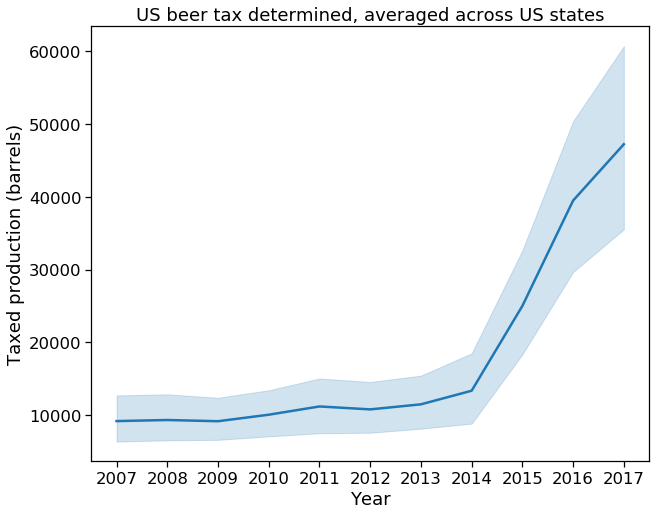

In [21]:
fig, ax = plt.subplots(figsize=(10,8))
p=sb.lineplot(x='Year', y='TaxedProduction', data=taxbeer_tidy, ax=ax, markers=True)
plt.xlabel("Year")
plt.ylabel("Taxed production (barrels)")
plt.title("US beer tax determined, averaged across US states") # You can comment this line out if you don't need title
plt.show(p)

<a id="section1b"></a>

## 1b. Google searches

In [22]:
# Data from https://trends.google.com
google_beer = pd.read_csv('databases/google_craft_beer.csv') 
google_beer.head(3)

,Year,Month,interest
0,2004,1,4
1,2004,2,6
2,2004,3,1


In [40]:
# For fun, divide the data into cold/warm
google_beer['season']=google_beer['Month'].apply(lambda x: 'winter' if (x<4 or x>8) else 'summer')
google_beer.head(3)

,Year,Month,interest,season
0,2004,1,4,winter
1,2004,2,6,winter
2,2004,3,1,winter


In [23]:
sb.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})

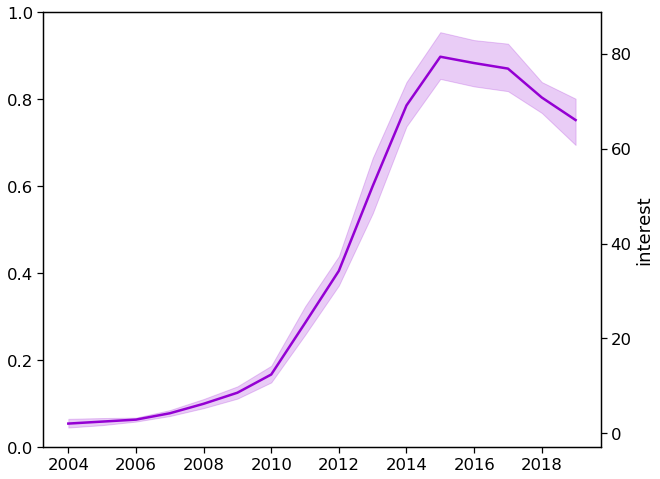

In [39]:
fig1, ax1 = plt.subplots(figsize=(10,8))
ax1 = plt.twinx()
p1=sb.lineplot(x='Year', y='interest',data=google_beer, ax=ax1, markers=True, color='darkviolet')
plt.xlabel("Year")
#plt.ylabel("Relative interest in <craft beer>")
#plt.title("Interest in  \"craft beer\" on  Google searches") # You can comment this line out if you don't need title
sb.despine(right=False, top=False)
plt.show(p1)

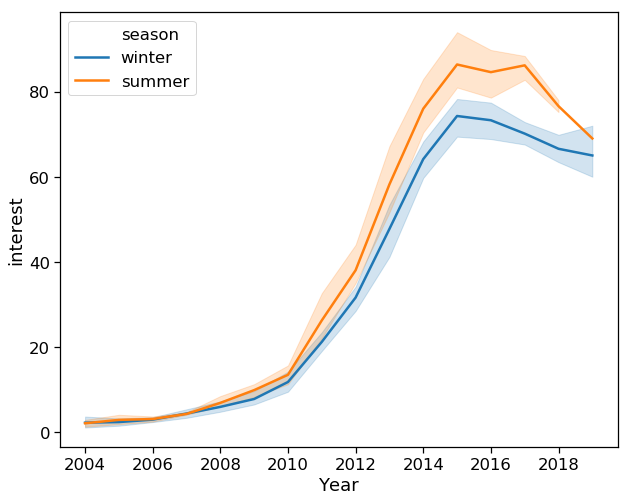

In [96]:
fig2, ax2 = plt.subplots(figsize=(10,8))
p2=sb.lineplot(x='Year', y='interest', hue='season',data=google_beer, ax=ax2, markers=True, color='darkviolet')
plt.xlabel("Year")
#plt.ylabel("Relative interest in <craft beer>")
#plt.title("Interest in  \"craft beer\" on  Google searches") # You can comment this line out if you don't need title
sb.despine(right=False, top=False)
plt.show(p2)

<a id="section2"></a>

[Back to top](#section0)

# 2. Get the top-rated beers from BeerAdvocate

### Make soup

In [42]:
# BeerAdvocate Top beers URL
pageurl='https://www.beeradvocate.com/lists/top/'

In [43]:
# Make the soup
time.sleep(0.1)
ba_page = requests.get(pageurl)
ba_pagetext = ba_page.text
soup = BeautifulSoup(ba_pagetext, 'lxml')

In [44]:
beer_url=[]
beer_name=[]
brewery_url=[]
brewery_name=[]
style_url=[]
style=[]
ba_rank=[]
aba=[]
num_ratings=[]
ba_score=[]

for dum_tr in soup.find_all('tr'):
    currlines=[]
    if len(dum_tr.find_all('a'))>1:
        for x in dum_tr.find_all('a'):
            currlines.append(x.get('href'))
            currlines.append(x.text)
        for y in dum_tr.find_all('td'):
            currlines.append(y.text)
        # Save all variables
        beer_url.append(currlines[0])
        beer_name.append(currlines[1])
        brewery_url.append(currlines[2])
        brewery_name.append(currlines[3])
        style_url.append(currlines[4])
        style.append(currlines[5])
        ba_rank.append(int(currlines[6]))
        aba.append(currlines[7][currlines[7].find('|')+2:])
        num_ratings.append(int(currlines[8].replace(',','')))
        ba_score.append(float(currlines[9]))
print('Beer extracted from soup')

Beer extracted from soup


### Make pandas dataframe

In [68]:
df_bestbeers = pd.DataFrame(
    {'ba_rank': ba_rank,
     'beer_name': beer_name,
     'brewery_name': brewery_name,
     'style': style,
     'abv': aba,
     'ba_score': ba_score,
     'num_ratings': num_ratings,
     'beer_url': beer_url,
     'brewery_url': brewery_url,
     'style_url': style_url
    })
df_bestbeers.head(3)

,ba_rank,beer_name,brewery_name,style,abv,ba_score,num_ratings,beer_url,brewery_url,style_url
0,1,Kentucky Brunch Brand Stout,Toppling Goliath Brewing Company,American Imperial Stout,12.00%,4.84,745,/beer/profile/23222/78820/,/beer/profile/23222/,/beer/styles/157/
1,2,Marshmallow Handjee,3 Floyds Brewing Co.,Russian Imperial Stout,15.00%,4.74,1659,/beer/profile/26/42349/,/beer/profile/26/,/beer/styles/84/
2,3,Barrel-Aged Abraxas,Perennial Artisan Ales,American Imperial Stout,11.00%,4.74,1492,/beer/profile/25888/87246/,/beer/profile/25888/,/beer/styles/157/


<a id="section3"></a>

[Back to top](#section0)

# 3. Get postal addresses and lat/long of all breweries making the best beers

In [46]:
brewery_address=[]
driver = webdriver.PhantomJS()
for br in np.arange(1,len(df_bestbeers)+1):
    burl=df_bestbeers.loc[df_bestbeers['ba_rank']==br,'brewery_url'][br-1]
    brwry_url='https://www.beeradvocate.com/'+burl
    driver.get(brwry_url)
    time.sleep(.05)
    address_element = driver.find_element_by_id(id_='info_box')
    brewery_address.append(address_element.text)
print('Done!')

/anaconda3/lib/python3.6/site-packages/selenium/webdriver/phantomjs/webdriver.py:49: UserWarning: Selenium support for PhantomJS has been deprecated, please use headless versions of Chrome or Firefox instead
  warnings.warn('Selenium support for PhantomJS has been deprecated, please use headless '


Done!


### Fix the brewery addresses and add to brewery dataframe

In [69]:
# Rows with numbers contain addresses:
r = re.compile("[0-9]+")
badr=[] # Initialize temporary variable to hold brewery addresses
row_ctr=0
for l in brewery_address:
    currline=l.split('\n')
    dum=[]
    for ln in currline:
        if len(list(filter(r.match, ln))) >0:
            dum.append(ln)
    badr.append(', '.join(dum[0:2]))
    #beers_df.loc[row_ctr,'brewery_address']=', '.join(dum[0:2])
    row_ctr+=1

In [70]:
df_bestbeers['brewery_address']=badr
df_bestbeers.head(3)

,ba_rank,beer_name,brewery_name,style,abv,ba_score,num_ratings,beer_url,brewery_url,style_url,brewery_address
0,1,Kentucky Brunch Brand Stout,Toppling Goliath Brewing Company,American Imperial Stout,12.00%,4.84,745,/beer/profile/23222/78820/,/beer/profile/23222/,/beer/styles/157/,"1600 Prosperity Rd, Decorah, Iowa, 52101"
1,2,Marshmallow Handjee,3 Floyds Brewing Co.,Russian Imperial Stout,15.00%,4.74,1659,/beer/profile/26/42349/,/beer/profile/26/,/beer/styles/84/,"9750 Indiana Pkwy, Munster, Indiana, 46321-4004"
2,3,Barrel-Aged Abraxas,Perennial Artisan Ales,American Imperial Stout,11.00%,4.74,1492,/beer/profile/25888/87246/,/beer/profile/25888/,/beer/styles/157/,"8125 Michigan Ave, Saint Louis, Missouri, 6311..."


### Extract zip code and use that to get the lat/long

In [52]:
usziplatlng_df = pd.read_csv('databases/us_zip_latlng.csv')

### Clean up - remove non-US beers and make sure all have zip codes
Luckily, foreign beers appear to not have 5-digit zip codes..

In [71]:
has_a_zip=[]
for curraddr in df_bestbeers['brewery_address']:
    x=re.search('\d{5}',curraddr)
    if (x):
        currzip=int(curraddr[x.start():x.end()])
    else:
        currzip=np.nan
    has_a_zip.append(currzip)
has_a_zip = pd.DataFrame({'zips':has_a_zip})
print( "{} of {} entries are nan".format(has_a_zip['zips'].isna().sum(),len(has_a_zip)))

27 of 250 entries are nan


In [72]:
# These should be the non-US ones:
df_bestbeers.loc[has_a_zip['zips'].isna(),'brewery_address']

8                  Hoogstraat 2, Beersel, 1650
20               Rue Gheude 56, Brussels, 1070
28                     1201 NE 38th St, Ste A1
34               Rue Gheude 56, Brussels, 1070
44         Donkerstraat 12, Westvleteren, 8640
66               Rue Gheude 56, Brussels, 1070
75            Beväringsgatan 2, Örebro, 701 49
77     Humletorvet 27, 3. sal, København, 1799
81                 Hoogstraat 2, Beersel, 1650
105                    1201 NE 38th St, Ste A1
108              Rue Gheude 56, Brussels, 1070
123                    1201 NE 38th St, Ste A1
129                2204 NE Alberta St, Ste 101
134              Rue Gheude 56, Brussels, 1070
136                Hoogstraat 2, Beersel, 1650
143                      446 Kent Ave, Apt 14A
148              Rue Gheude 56, Brussels, 1070
151                Hoogstraat 2, Beersel, 1650
155         Rue de l'Abbaye 8, Rochefort, 5580
169                Hoogstraat 2, Beersel, 1650
177                      446 Kent Ave, Apt 14A
193          

#### Three US addresses included:
1201 NE 38th St, Ste A1 = 1201 NE 38th St, Oakland Park, Florida, 33334-4504<br>
2204 NE Alberta St, Ste 101 = 2204 NE Alberta St, Portland, Oregon, 97211-5885<br>
446 Kent Ave, Apt 14A = Office location, exclude this one

In [73]:
df_bestbeers.loc[df_bestbeers['brewery_address']=='1201 NE 38th St, Ste A1','brewery_address'] = '1201 NE 38th St, Oakland Park, Florida, 33334-4504'
df_bestbeers.loc[df_bestbeers['brewery_address']=='2204 NE Alberta St, Ste 101','brewery_address'] = '2204 NE Alberta St, Portland, Oregon, 97211-5885'
# Discovered one more in getting zips:
df_bestbeers.loc[df_bestbeers['brewery_address']=='11197 Brockway Rd, SPC 1','brewery_address'] = '11197 Brockway Rd Suite 1, Truckee, CA 96161'

### Delete NaN rows, reindex

In [74]:
df_bestbeers.drop(df_bestbeers.index[list(df_bestbeers.index[has_a_zip['zips'].isna()])],inplace=True)
df_bestbeers.reset_index(drop=True,inplace=True)

In [75]:
# Check again:
has_a_zip=[]
for curraddr in df_bestbeers['brewery_address']:
    x=re.search('\d{5}',curraddr)
    if (x):
        currzip=int(curraddr[x.start():x.end()])
    else:
        currzip=np.nan
    has_a_zip.append(currzip)
has_a_zip = pd.DataFrame({'zips':has_a_zip})
print( "{} of {} entries are nan".format(has_a_zip['zips'].isna().sum(),len(has_a_zip)))

0 of 223 entries are nan


### Extract state, zip code, latitude, longitude, append to dataframe

In [76]:
zips=[]
lat=[]
lng=[]
state=[]
for curraddr in df_bestbeers['brewery_address']:
    dum=curraddr[3:]
    x=re.search('\d{5}',dum) # Some start with 5-digit street numbers
    if (x):
        currzip=int(dum[x.start():x.end()])
    else:
        currzip=np.nan
    zips.append(currzip)
    # Get lat/long
    if np.isnan(currzip):
        currlat=np.nan
        currlng=np.nan
    else:
        if len(usziplatlng_df.loc[usziplatlng_df['Zip']==currzip])>0: # So the zip has lat/lng entries
            currlat = list(usziplatlng_df.loc[usziplatlng_df['Zip']==currzip,'Latitude'])[0]
            currlng = list(usziplatlng_df.loc[usziplatlng_df['Zip']==currzip,'Longitude'])[0]
            currstate = list(usziplatlng_df.loc[usziplatlng_df['Zip']==currzip,'State'])[0]
        else:
            currlat=np.nan
            currlng=np.nan
            currstate=np.nan
    lat.append(currlat)
    lng.append(currlng)
    state.append(currstate)
df_bestbeers['zips']=zips
df_bestbeers['lat']=lat
df_bestbeers['lng']=lng
df_bestbeers['state']=state
df_bestbeers.head(3)

,ba_rank,beer_name,brewery_name,style,abv,ba_score,num_ratings,beer_url,brewery_url,style_url,brewery_address,zips,lat,lng,state
0,1,Kentucky Brunch Brand Stout,Toppling Goliath Brewing Company,American Imperial Stout,12.00%,4.84,745,/beer/profile/23222/78820/,/beer/profile/23222/,/beer/styles/157/,"1600 Prosperity Rd, Decorah, Iowa, 52101",52101,43.345879,-91.77187,IA
1,2,Marshmallow Handjee,3 Floyds Brewing Co.,Russian Imperial Stout,15.00%,4.74,1659,/beer/profile/26/42349/,/beer/profile/26/,/beer/styles/84/,"9750 Indiana Pkwy, Munster, Indiana, 46321-4004",46321,41.551457,-87.50143,IN
2,3,Barrel-Aged Abraxas,Perennial Artisan Ales,American Imperial Stout,11.00%,4.74,1492,/beer/profile/25888/87246/,/beer/profile/25888/,/beer/styles/157/,"8125 Michigan Ave, Saint Louis, Missouri, 6311...",63111,38.559302,-90.25174,MO


### Convert ABV to float

#### Some ABV are missing and have garbage text

In [82]:
bad_abv_idx=[]
for i in df_bestbeers.index:
    dum = re.match('[a-z]',df_bestbeers.loc[i,'abv'])
    if dum:
        bad_abv_idx.append(i)
df_bestbeers.loc[bad_abv_idx,'abv']

42          aronHill Farmstead BreweryBritish Barleywine
45         lora PlumHill Farmstead BreweryBelgian Saison
87     eyond Good And EvilHill Farmstead BreweryAmeri...
190    lora - BlueberryHill Farmstead BreweryBelgian ...
Name: abv, dtype: object

In [84]:
# Make these NaN to drop and reindex
df_bestbeers.loc[bad_abv_idx,'abv']=np.nan

In [90]:
df_bestbeers.dropna(subset=['abv'],inplace=True)

#### Convert remaining ABV to float

In [92]:
for i in df_bestbeers.index:
    x=df_bestbeers.loc[i,'abv']
    dum=float(x.replace('%',''))
    df_bestbeers.loc[i,'abv']=dum
df_bestbeers.head(3)

,ba_rank,beer_name,brewery_name,style,abv,ba_score,num_ratings,beer_url,brewery_url,style_url,brewery_address,zips,lat,lng,state
0,1,Kentucky Brunch Brand Stout,Toppling Goliath Brewing Company,American Imperial Stout,12,4.84,745,/beer/profile/23222/78820/,/beer/profile/23222/,/beer/styles/157/,"1600 Prosperity Rd, Decorah, Iowa, 52101",52101,43.345879,-91.77187,IA
1,2,Marshmallow Handjee,3 Floyds Brewing Co.,Russian Imperial Stout,15,4.74,1659,/beer/profile/26/42349/,/beer/profile/26/,/beer/styles/84/,"9750 Indiana Pkwy, Munster, Indiana, 46321-4004",46321,41.551457,-87.50143,IN
2,3,Barrel-Aged Abraxas,Perennial Artisan Ales,American Imperial Stout,11,4.74,1492,/beer/profile/25888/87246/,/beer/profile/25888/,/beer/styles/157/,"8125 Michigan Ave, Saint Louis, Missouri, 6311...",63111,38.559302,-90.25174,MO


In [94]:
df_bestbeers.shape

(219, 15)

### We are left with a clean database of 219 beers from the Beer Advocate Best Beers list

In [95]:
# Save this version of the dataframe
df_bestbeers.to_pickle('BA_bestbeersV1.pkl')
df_bestbeers.to_csv('BA_bestbeersV1.csv')

<a id="section4"></a>

[Back to top](#section0)

# 4. Use Foursquare to recover neighborhood characteristics of the beers
#### We will use the latitude/longitude of the breweries 

#### Define foursquare credentials

In [97]:
CLIENT_ID = 'E0QX1ORXXGLQ02P12R0Q3OZKDZH4DF0XYMUOVVVFF03V35HH' # your Foursquare ID
CLIENT_SECRET = 'RNW1FQRCDTNWYTBJBIPAC200PBKBF1GPT3WJSJ5YWXFPVD4J' # your Foursquare Secret
VERSION = '20180604'
LIMIT = 30
print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: E0QX1ORXXGLQ02P12R0Q3OZKDZH4DF0XYMUOVVVFF03V35HH
CLIENT_SECRET:RNW1FQRCDTNWYTBJBIPAC200PBKBF1GPT3WJSJ5YWXFPVD4J


#### Loop over all lat/long coordinates and retrieve Foursquare venues data

In [98]:
# Define limits. Radius is chosen as 10Km to get a wider sense of each location, and limit is set to the maximum
LIMIT=100
RADIUS=10000

In [99]:
# Function to get data from 4sq result - venues/category
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [159]:
# Get the list of all unique breweries
brewery_list = set(df_bestbeers['brewery_name'])

# Create an empty dataframe that will hold all unique breweries' data. 
df_foursquare = pd.DataFrame({'name':[], 'categories': [], 'lat': [], 'lng': [], 'brewery_name': []})

##### Loop-de-loop

In [162]:
for brwry in brewery_list:
    print(brwry)
    lat = list(df_bestbeers.loc[df_bestbeers['brewery_name']==brwry,'lat'])[0]
    lng = list(df_bestbeers.loc[df_bestbeers['brewery_name']==brwry,'lng'])[0]
    
    url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, VERSION, lat, lng,  RADIUS, LIMIT)
    brwry_results = requests.get(url).json()
    
    venues = brwry_results['response']['groups'][0]['items']
    nearby_venues = json_normalize(venues) # flatten JSON
    
    # filter columns
    filtered_columns = ['venue.name','venue.categories', 'venue.location.lat', 'venue.location.lng']
    nearby_venues =nearby_venues.loc[:, filtered_columns]

    # filter the category for each row
    nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)
    
    # clean columns
    nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]
    
    # Add brewery name
    nearby_venues['brewery_name']=brwry
    
    # add to dataframe
    df_foursquare=df_foursquare.append(nearby_venues)
print('Done. Recovered a {} dataframe.'.format(df_foursquare.shape))
df_foursquare.head(3)

Allagash Brewing Company
Heist Brewery
Holy Mountain Brewing Company
FiftyFifty Brewing Co.
Monkish Brewing Co.
Russian River Brewing Company
Ozark Beer Co.
Perennial Artisan Ales
Anchorage Brewing Company
Aslin Beer Company
Hoof Hearted Brewing
Cigar City Brewing
Kane Brewing Company
Bottle Logic Brewing
Spiteful Brewing
New England Brewing Co.
Prairie Artisan Ales
The Lost Abbey
Jester King Brewery
Angry Chair Brewing
Modern Times Beer
Stone Brewing
Dark Horse Brewing Company
Toppling Goliath Brewing Company
Pipeworks Brewing Company
Casey Brewing & Blending
Parish Brewing Company
de Garde Brewing
Columbus Brewing Company
Hill Farmstead Brewery
Goose Island Beer Co.
Founders Brewing Company
Kuhnhenn Brewing Company
Alpine Beer Company
Fat Head's Brewery & Saloon
J. Wakefield Brewing
Sante Adairius Rustic Ales
Voodoo Brewery
Fremont Brewing Company
Surly Brewing Company
Westbrook Brewing Co.
Perrin Brewing Co.
Deschutes Brewery
Haymarket Beer Co. Pub & Brewery
Bissell Brothers Brewing

,name,categories,lat,lng,brewery_name
0,Starbucks,Coffee Shop,43.684040,-70.291510,Allagash Brewing Company
1,Tipo,Italian Restaurant,43.677577,-70.281132,Allagash Brewing Company
2,Bruno's,Italian Restaurant,43.689445,-70.293114,Allagash Brewing Company


In [167]:
# Save to disk
df_foursquare.to_pickle('Foursquare_data.pkl')
df_foursquare.to_csv('Foursquare_data.csv')

<a id="section5"></a>

[Back to top](#section0)

# 5. Getting a list of all US breweries with their geographical coordinates
#### NB: This list will be used to cluster US mainland breweries

<a id="section5a"></a>

## 5a. Recover data from html file downloaded from https://www.brewersassociation.org/directories/breweries/

In [168]:
brewfile='databases/USBreweries_BrewersAssociation.html'
soup = BeautifulSoup(open(brewfile), "lxml")

### Get the good stuff from the soup

In [169]:
brewery_name=[]
brewery_address=[]
brewery_type=[]

In [170]:
for dum_ul in soup.find_all('ul', class_="vcard simple brewery-info"):
    b_name=dum_ul.find('li', class_="name").text.strip()
    b_adr1=dum_ul.find('li', class_="address").text.strip()
    b_adr2=dum_ul.find('li').next_element.next_element.next_element.next_element.text[0:-6].strip()
    b_type=dum_ul.find('li', class_="brewery_type").text[6:].strip()
    
    brewery_name.append(b_name)
    brewery_type.append(b_type)
    
    if len(b_adr1)<3:
        brewery_address.append(b_adr2)
    elif len(b_adr2)<3:
        brewery_address.append('USA')
    else:
        brewery_address.append(b_adr1+', '+b_adr2)
    
print('Done!')

Done!


In [171]:
df_usbreweries=pd.DataFrame({'brewery_name': brewery_name, 'brewery_address': brewery_address, 'brewery_type': brewery_type})
df_usbreweries.head(3)

,brewery_name,brewery_address,brewery_type
0,(405) Brewing Co,"1716 Topeka St, Norman, OK 73069-8224",Micro
1,(512) Brewing Co,"407 Radam Ln Ste F200, Austin, TX 78745-1197",Micro
2,10 Torr Distilling and Brewing,"490 Mill St, Reno, NV 89502",Micro


<a id="section5b"></a>

## 5b. Clean up the database 

#### Look for addresses that do not contain a ST ZIP combination and remove these

In [172]:
bad_addr_index=[]
for i in df_usbreweries.index:
    curraddr = df_usbreweries.loc[i,'brewery_address']
    # Search for State-Zip
    dum=re.search("([A-Z]{2}) \d{5}", curraddr)
    if not(dum): # so no match
        bad_addr_index.append(i)
len(bad_addr_index)

77

In [173]:
# Drop the ~10% without matching addresses
df_usbreweries.drop(bad_addr_index, inplace=True)
df_usbreweries.reset_index(drop=True,inplace=True)
df_usbreweries.shape

(7127, 3)

#### Get state, zip, lat, lng

In [174]:
bstate=[]
bzip=[]
blat=[]
blng=[]
for curraddr in df_usbreweries['brewery_address']:
    dum=re.search("([A-Z]{2}) \d{5}", curraddr)
    if dum:
        currstatezip = curraddr[dum.start():dum.end()]
        currstate=currstatezip[0:2]
        currzip=int(currstatezip[3:])
        # ---- Check Lat/lng
        if len(usziplatlng_df.loc[usziplatlng_df['Zip']==currzip])>0: # So the zip has lat/lng entries, NB: this data loaded earlier
            currlat = list(usziplatlng_df.loc[usziplatlng_df['Zip']==currzip,'Latitude'])[0]
            currlng = list(usziplatlng_df.loc[usziplatlng_df['Zip']==currzip,'Longitude'])[0]
        else:
            currlat=np.nan
            currlng=np.nan
    else:
        currstate=np.nan
        currzip=np.nan
    bstate.append(currstate)
    bzip.append(currzip)
    blat.append(currlat)
    blng.append(currlng)
print('Done')

Done


In [175]:
# Save to the dataframe
df_usbreweries['bstate']=bstate
df_usbreweries['bzip']=bzip
df_usbreweries['blat']=blat
df_usbreweries['blng']=blng
df_usbreweries.head(3)

,brewery_name,brewery_address,brewery_type,bstate,bzip,blat,blng
0,(405) Brewing Co,"1716 Topeka St, Norman, OK 73069-8224",Micro,OK,73069,35.228649,-97.45629
1,(512) Brewing Co,"407 Radam Ln Ste F200, Austin, TX 78745-1197",Micro,TX,78745,30.207559,-97.79575
2,10 Torr Distilling and Brewing,"490 Mill St, Reno, NV 89502",Micro,NV,89502,39.499862,-119.77497


In [176]:
# Check if any NaN
df_usbreweries['bzip'].isna().sum()

0

In [177]:
df_usbreweries['blat'].isna().sum()

69

In [179]:
# Manually add in the 2 most frequent:
# NB: Looked up the values on google maps

df_usbreweries.loc[df_usbreweries['bzip']==92081,'blat']=33.16
df_usbreweries.loc[df_usbreweries['bzip']==92081,'blng']=-117.25

df_usbreweries.loc[df_usbreweries['bzip']==97703,'blat']=44.1
df_usbreweries.loc[df_usbreweries['bzip']==97703,'blng']=-121.3

#### Add in as many of the remaining by partial address lookup, drop the rest of the rows

In [ ]:
dum=df_usbreweries.loc[df_usbreweries['blat'].isna(),'bzip'].value_counts()
geolocator = Nominatim(user_agent="beer_explorer")
# Manually including lat/lng
for currzip in dum.index:
    time.sleep(2)
    location = geolocator.geocode(str(currzip)+", USA")
    if location is not None:
        currlat = location.latitude
        currlng = location.longitude
           
        df_usbreweries.loc[df_usbreweries['bzip']==currzip,'blat']=currlat
        df_usbreweries.loc[df_usbreweries['bzip']==currzip,'blng']=currlng
print('Done')

In [192]:
df_usbreweries.dropna(subset=['blat'],inplace=True)

#### Restrict data to mainland US excluding Alaska and  territories

In [202]:
df_usbreweries.loc[df_usbreweries['bstate']=='AL','bstate']=np.nan
df_usbreweries.loc[df_usbreweries['bstate']=='VI','bstate']=np.nan
df_usbreweries.loc[df_usbreweries['bstate']=='PR','bstate']=np.nan
df_usbreweries.loc[df_usbreweries['bstate']=='GU','bstate']=np.nan

In [216]:
df_usbreweries.dropna(subset=['bstate'],inplace=True)
df_usbreweries.shape

(7072, 7)

#### Also, remove all lat/lng outside US mainland extent
##### Approx US mainland extent
Latitude:48 to 26<br>
Longitude: -125.5 to -66

In [224]:
df_usbreweries.loc[df_usbreweries['blat']<26,'blat']=np.nan
df_usbreweries.loc[df_usbreweries['blat']>48,'blat']=np.nan
df_usbreweries.loc[df_usbreweries['blng']<-125.5,'blng']=np.nan
df_usbreweries.loc[df_usbreweries['blng']>-66,'blng']=np.nan
# And drop those rows
df_usbreweries.dropna(subset=['blat','blng'],inplace=True)
df_usbreweries.shape

(6912, 9)

In [220]:
df_usbreweries.head(3)

,brewery_name,brewery_address,brewery_type,bstate,bzip,blat,blng,lat,lng
0,(405) Brewing Co,"1716 Topeka St, Norman, OK 73069-8224",Micro,OK,73069,35.228649,-97.45629,NaN,NaN
1,(512) Brewing Co,"407 Radam Ln Ste F200, Austin, TX 78745-1197",Micro,TX,78745,30.207559,-97.79575,NaN,NaN
2,10 Torr Distilling and Brewing,"490 Mill St, Reno, NV 89502",Micro,NV,89502,39.499862,-119.77497,NaN,NaN


In [225]:
# Save to disk
df_usbreweries.to_pickle('BreweryData.pkl')
df_usbreweries.to_csv('BreweryData.csv')

<a id="section5c"></a>

## 5c. Check on a map

In [210]:
from folium import plugins

In [235]:
# US latitude and longitude values
# retrieved from https://gps-coordinates.org/united-states-latitude.php
us_lat = 39.381266
us_lng = -97.922211

beer_heat_map = folium.Map(location=[us_lat, us_lng], zoom_start=4, min_zoom=4, max_zoom=4)

# convert to (n, 2) nd-array format for heatmap
brwry_heatmap = df_usbreweries[['blat', 'blng']].values

# plot heatmap
beer_heat_map.add_child(plugins.HeatMap(brwry_heatmap, radius=13, overlay=True, min_opacity=.8))

In [228]:
brewery_map = folium.Map(location=[us_lat, us_lng], zoom_start=4, min_zoom=4, max_zoom=4)
# Add small gray markers for all breweries
for index, row in df_usbreweries.iterrows():
    folium.CircleMarker([row['blat'], row['blng']],
                        radius=0.1,
                        popup=row['brewery_name'],
                        fill_color="d8dcd6",
                        fill_opacity=0.1
                       ).add_to(brewery_map)
brewery_map

[Back to top](#section0)